##### Importing necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('ecommerce_train.csv')
df.head()

,session_id,administrative,administrative_duration,informational,informational_duration,productrelated,productrelated_duration,bouncerates,exitrates,pagevalues,specialday,month,operatingsystems,browser,region,traffictype,visitortype,weekend,revenue
0,139957,2,47.500000,0,0.0,19,1203.480714,0.000000,0.027421,6.748509,0.0,Nov,2,2,3,2,Returning_Visitor,False,0
1,496587,0,0.000000,0,0.0,7,152.000000,0.000000,0.033333,0.000000,0.0,Dec,3,2,6,3,Returning_Visitor,False,0
2,440268,7,206.500000,1,389.9,95,4415.889952,0.000133,0.033750,2.676062,0.0,Nov,2,2,1,20,Returning_Visitor,False,0
3,294672,1,18.258571,0,0.0,103,8305.048706,0.004871,0.034746,6.824908,0.0,Nov,2,2,1,2,Returning_Visitor,True,1
4,497475,0,0.000000,0,0.0,42,1305.108333,0.016068,0.039742,0.000000,0.0,Dec,3,2,5,2,Returning_Visitor,False,0


##### Exploring the Data

In [3]:
df.columns

Index(['session_id', 'administrative', 'administrative_duration',
       'informational', 'informational_duration', 'productrelated',
       'productrelated_duration', 'bouncerates', 'exitrates', 'pagevalues',
       'specialday', 'month', 'operatingsystems', 'browser', 'region',
       'traffictype', 'visitortype', 'weekend', 'revenue'],
      dtype='object')

In [56]:
df.skew()

C:\Windows\Temp\ipykernel_10384\1665899112.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.skew()


session_id                -0.001228
administrative             1.878720
administrative_duration    4.496394
informational              3.337657
informational_duration     6.468479
productrelated             3.538555
productrelated_duration    3.454376
bouncerates                2.979848
exitrates                  2.183513
pagevalues                 4.754348
specialday                 3.177445
region                     0.919170
weekend                    1.326282
revenue                    1.872543
dtype: float64

In [57]:
df.kurt()

C:\Windows\Temp\ipykernel_10384\1257127604.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df.kurt()


session_id                 -1.190284
administrative              3.691344
administrative_duration    28.420223
informational              13.770951
informational_duration     52.116795
productrelated             18.075421
productrelated_duration    18.123008
bouncerates                 7.867173
exitrates                   4.172353
pagevalues                 33.965983
specialday                  9.030686
region                     -0.277910
weekend                    -0.240987
revenue                     1.506492
dtype: float64

In [4]:
df.shape

(40000, 19)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   session_id               40000 non-null  int64  
 1   administrative           40000 non-null  int64  
 2   administrative_duration  40000 non-null  float64
 3   informational            40000 non-null  int64  
 4   informational_duration   40000 non-null  float64
 5   productrelated           40000 non-null  int64  
 6   productrelated_duration  40000 non-null  float64
 7   bouncerates              40000 non-null  float64
 8   exitrates                40000 non-null  float64
 9   pagevalues               40000 non-null  float64
 10  specialday               40000 non-null  float64
 11  month                    40000 non-null  object 
 12  operatingsystems         40000 non-null  object 
 13  browser                  40000 non-null  object 
 14  region                

In [6]:
df.isnull().sum()

session_id                 0
administrative             0
administrative_duration    0
informational              0
informational_duration     0
productrelated             0
productrelated_duration    0
bouncerates                0
exitrates                  0
pagevalues                 0
specialday                 0
month                      0
operatingsystems           0
browser                    0
region                     0
traffictype                0
visitortype                0
weekend                    0
revenue                    0
dtype: int64

##### Statistical Records for the Dataset

In [7]:
for col in df.columns:
    print("{} have {} unique values: {}".format(col, df[col].nunique(), df[col].dtypes))
    if df[col].dtypes == 'int64' or df[col].dtypes == 'bool':
        print("{} values: {}".format(col,df[col].unique()))

session_id have 40000 unique values: int64
session_id values: [139957 496587 440268 ... 370016 211469 314094]
administrative have 23 unique values: int64
administrative values: [ 2  0  7  1 11  3  4  5  8 15  6 12  9 13 10 16 22 14 18 17 21 20 19]
administrative_duration have 9594 unique values: float64
informational have 12 unique values: int64
informational values: [ 0  1  2  5  4  3  9  6  8  7 11 10]
informational_duration have 3634 unique values: float64
productrelated have 382 unique values: int64
productrelated values: [ 19   7  95 103  42  26 138   4   2   1  23  25  20  13  61  79  92   9
  40  21  24  12  11  18  14   5  30  17  28 186  66 121  22  52  94   3
  53  37   8  56  47  90  54  68 183  38  60  31 157  77  55  48  63  15
 152  34   6  85  78  16 176  62  44  81  84  10 250  39  64 118  89 135
  72 279  45  35 245  36  41  65 113  27  86   0  29 160  50  99 177 153
 169  49  67  74  70 127 126 178  57 236 188  32  46  87 159  33  51  80
 123 165 190 105 217  71  76 1

In [8]:
df.describe()

,session_id,administrative,administrative_duration,informational,informational_duration,productrelated,productrelated_duration,bouncerates,exitrates,pagevalues,specialday,region,revenue
count,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000
mean,311469.372075,2.544150,89.794383,0.555225,40.977236,34.026975,1148.105672,0.021969,0.042307,6.494963,0.063552,3.241975,0.158275
std,108498.432497,3.667252,182.964645,1.332627,153.114387,46.798102,1666.181462,0.048533,0.048633,17.710646,0.199463,2.423586,0.365003
min,123460.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,217950.000000,0.000000,0.000000,0.000000,0.000000,7.000000,183.883333,0.000000,0.013389,0.000000,0.000000,1.000000,0.000000
50%,311194.500000,1.000000,11.200000,0.000000,0.000000,19.000000,560.075000,0.003304,0.025000,0.000000,0.000000,3.000000,0.000000
75%,404680.500000,4.000000,110.154167,0.000000,0.000000,41.000000,1420.536667,0.016667,0.050000,0.000000,0.000000,4.000000,0.000000
max,499982.000000,22.000000,1946.000000,11.000000,1767.666667,440.000000,18504.126210,0.200000,0.200000,226.677702,1.000000,9.000000,1.000000


In [9]:
df.describe(include='all')

,session_id,administrative,administrative_duration,informational,informational_duration,productrelated,productrelated_duration,bouncerates,exitrates,pagevalues,specialday,month,operatingsystems,browser,region,traffictype,visitortype,weekend,revenue
count,40000.000000,40000.00000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000,40000,40000,40000.000000,40000,40000,40000,40000.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,6,11,NaN,15,3,2,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,May,2,2,NaN,2,Returning_Visitor,False,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11048,21638,25540,NaN,12545,34496,31053,NaN
mean,311469.372075,2.54415,89.794383,0.555225,40.977236,34.026975,1148.105672,0.021969,0.042307,6.494963,0.063552,NaN,NaN,NaN,3.241975,NaN,NaN,NaN,0.158275
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
min,123460.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,0.000000
25%,217950.000000,0.00000,0.000000,0.000000,0.000000,7.000000,183.883333,0.000000,0.013389,0.000000,0.000000,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,0.000000
50%,311194.500000,1.00000,11.200000,0.000000,0.000000,19.000000,560.075000,0.003304,0.025000,0.000000,0.000000,NaN,NaN,NaN,3.000000,NaN,NaN,NaN,0.000000
75%,404680.500000,4.00000,110.154167,0.000000,0.000000,41.000000,1420.536667,0.016667,0.050000,0.000000,0.000000,NaN,NaN,NaN,4.000000,NaN,NaN,NaN,0.000000


In [10]:
df.corr()

,session_id,administrative,administrative_duration,informational,informational_duration,productrelated,productrelated_duration,bouncerates,exitrates,pagevalues,specialday,region,weekend,revenue
session_id,1.000000,-0.007078,-0.004042,-0.001931,-0.003452,-0.003221,0.007205,-0.003203,-0.000349,0.002764,0.003194,-0.001583,-0.007766,-0.002496
administrative,-0.007078,1.000000,0.584529,0.391087,0.274090,0.448662,0.404032,-0.216590,-0.305020,0.111897,-0.113679,0.000507,0.013816,0.153079
administrative_duration,-0.004042,0.584529,1.000000,0.280617,0.199530,0.294955,0.295905,-0.151642,-0.211213,0.078031,-0.085400,0.000327,0.017291,0.108333
informational,-0.001931,0.391087,0.280617,1.000000,0.580722,0.377596,0.382680,-0.114288,-0.164321,0.081242,-0.063980,-0.023207,0.017216,0.111732
informational_duration,-0.003452,0.274090,0.199530,0.580722,1.000000,0.271295,0.281936,-0.075931,-0.108674,0.058064,-0.036898,-0.012577,0.015120,0.081428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pagevalues,0.002764,0.111897,0.078031,0.081242,0.058064,0.079132,0.086422,-0.128633,-0.171443,1.000000,-0.058967,-0.004583,0.009022,0.507821
specialday,0.003194,-0.113679,-0.085400,-0.063980,-0.036898,-0.047809,-0.048580,0.066774,0.089374,-0.058967,1.000000,-0.013882,-0.049480,-0.078758
region,-0.001583,0.000507,0.000327,-0.023207,-0.012577,-0.012477,-0.016108,-0.011816,-0.010686,-0.004583,-0.013882,1.000000,-0.005222,-0.010116
weekend,-0.007766,0.013816,0.017291,0.017216,0.015120,-0.012593,-0.008661,-0.048048,-0.058484,0.009022,-0.049480,-0.005222,1.000000,0.020203


In [65]:
# define numerical & categorical columns
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 14 numerical features : ['session_id', 'administrative', 'administrative_duration', 'informational', 'informational_duration', 'productrelated', 'productrelated_duration', 'bouncerates', 'exitrates', 'pagevalues', 'specialday', 'region', 'weekend', 'revenue']

We have 5 categorical features : ['month', 'operatingsystems', 'browser', 'traffictype', 'visitortype']


##### Heatmap

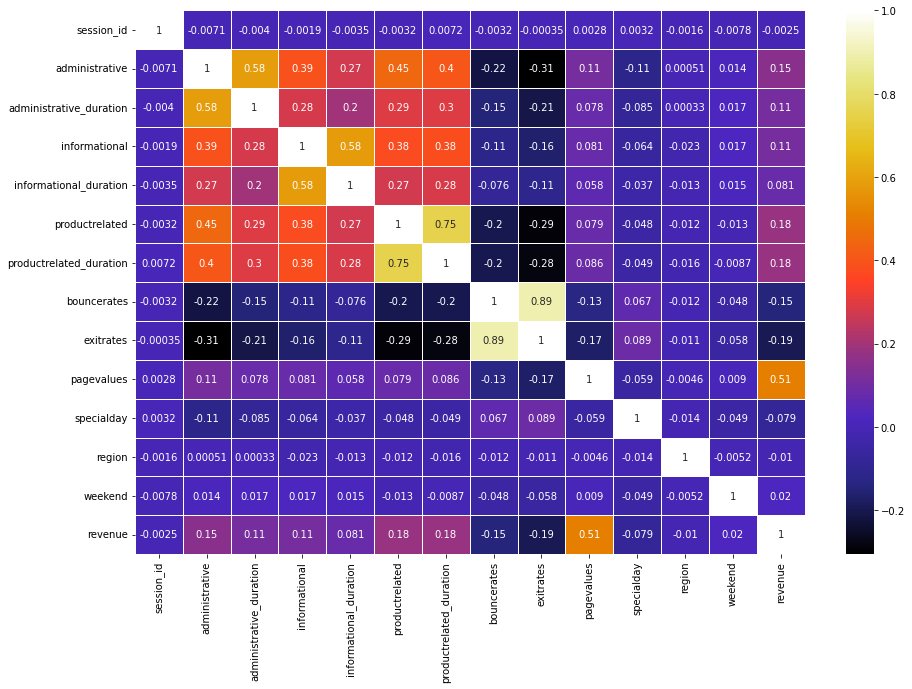

In [11]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot= True,linewidths=1, linecolor="white", cbar=True, 
            cmap = "CMRmap",xticklabels="auto", yticklabels="auto")
                     
plt.savefig('heatmap.png')

##### Finding out the Outliers

In [75]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
df_num=df.select_dtypes(include=numerics)

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



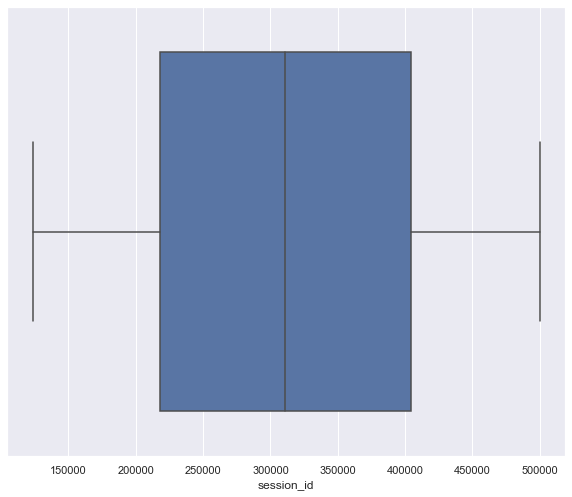

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



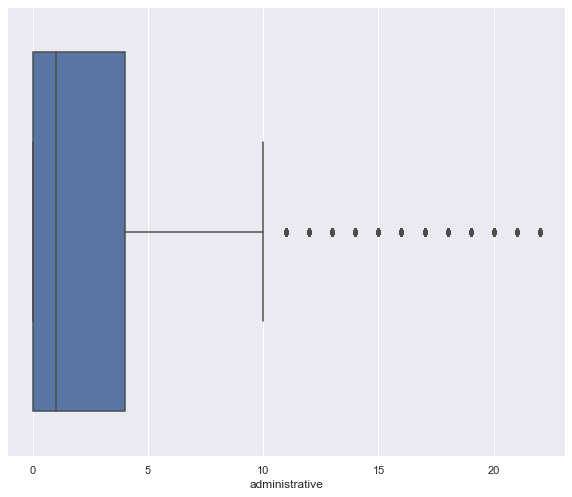

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



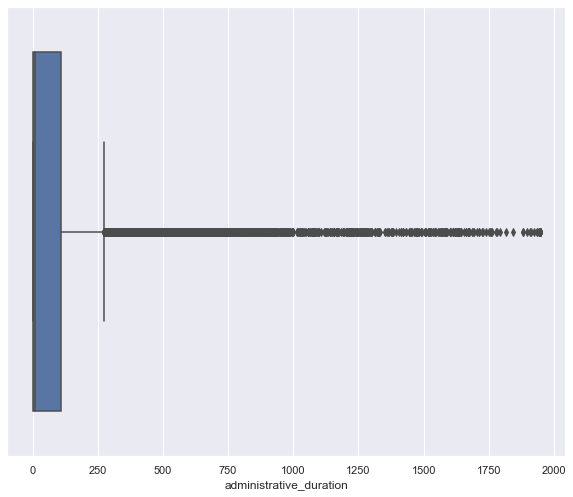

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



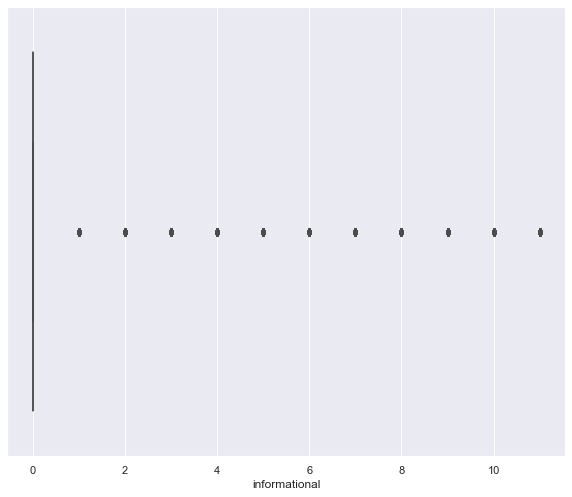

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



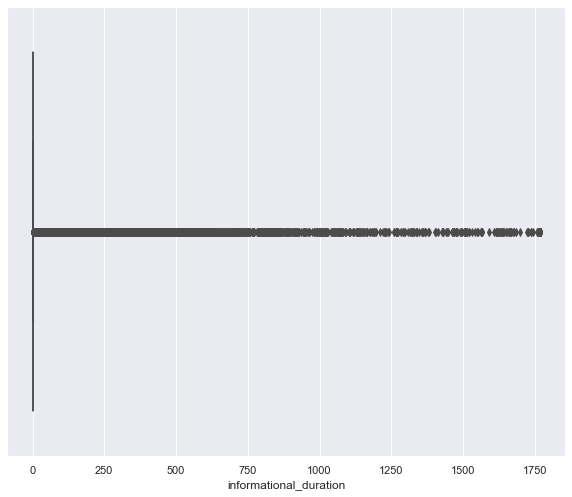

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



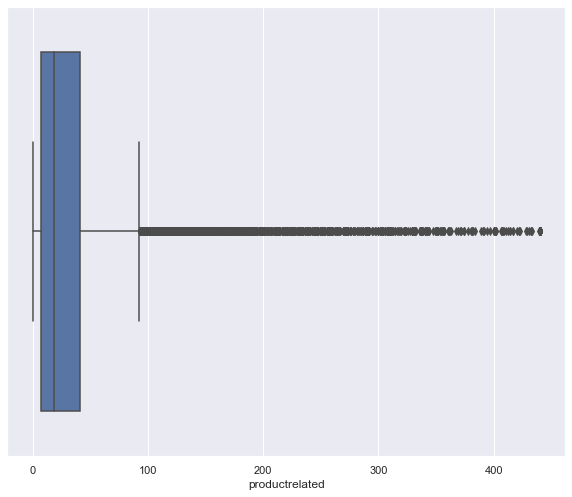

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



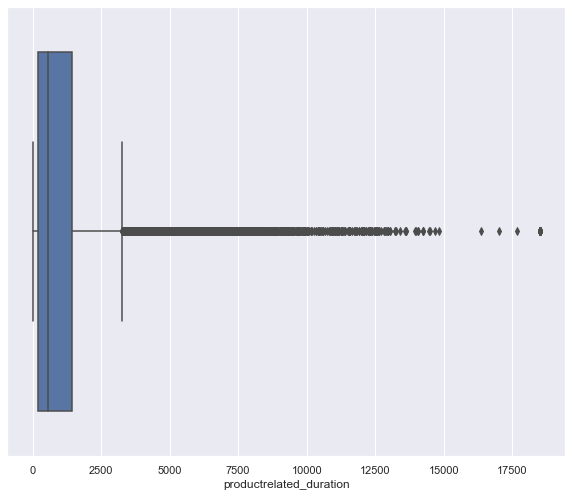

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



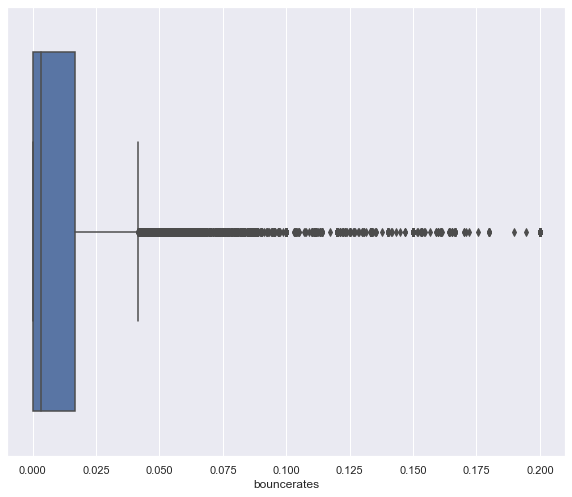

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



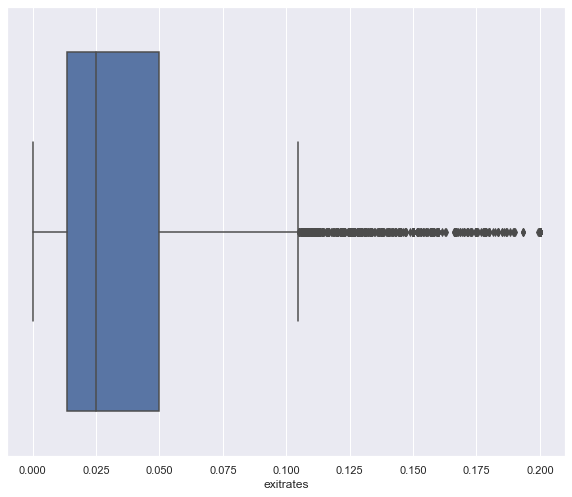

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



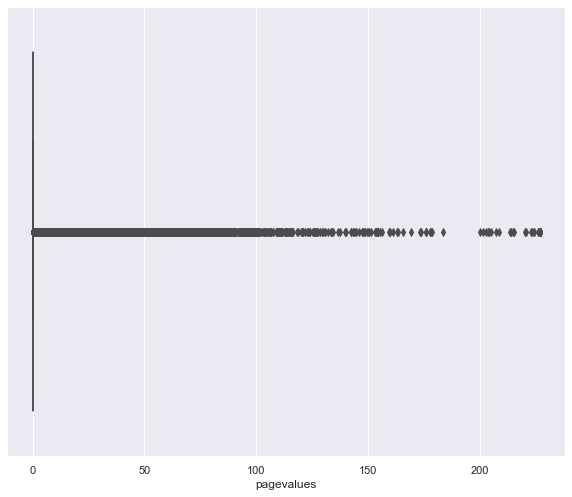

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



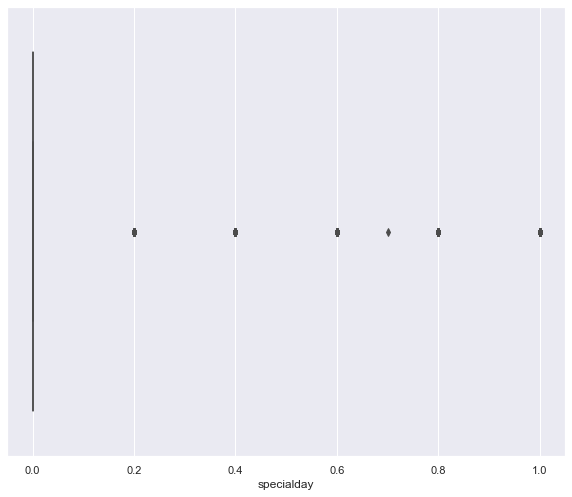

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



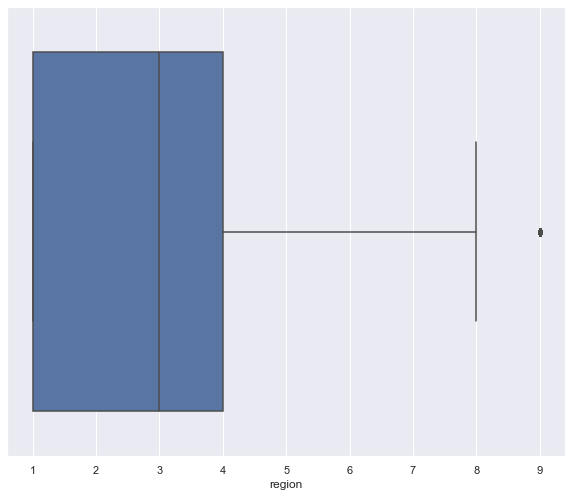

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



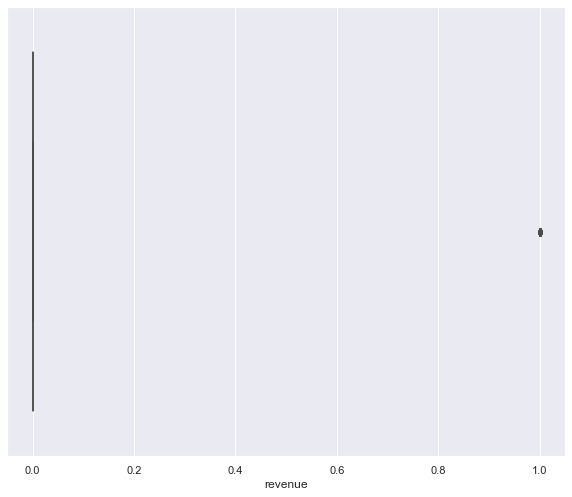

In [79]:
sns.set(rc={'figure.figsize':(10,8.27)})
sns.set_theme(style="darkgrid")
for i in df_num.columns:
    sns.boxplot(df_num[i])
    plt.show()

##### Exploratory Data Analysis

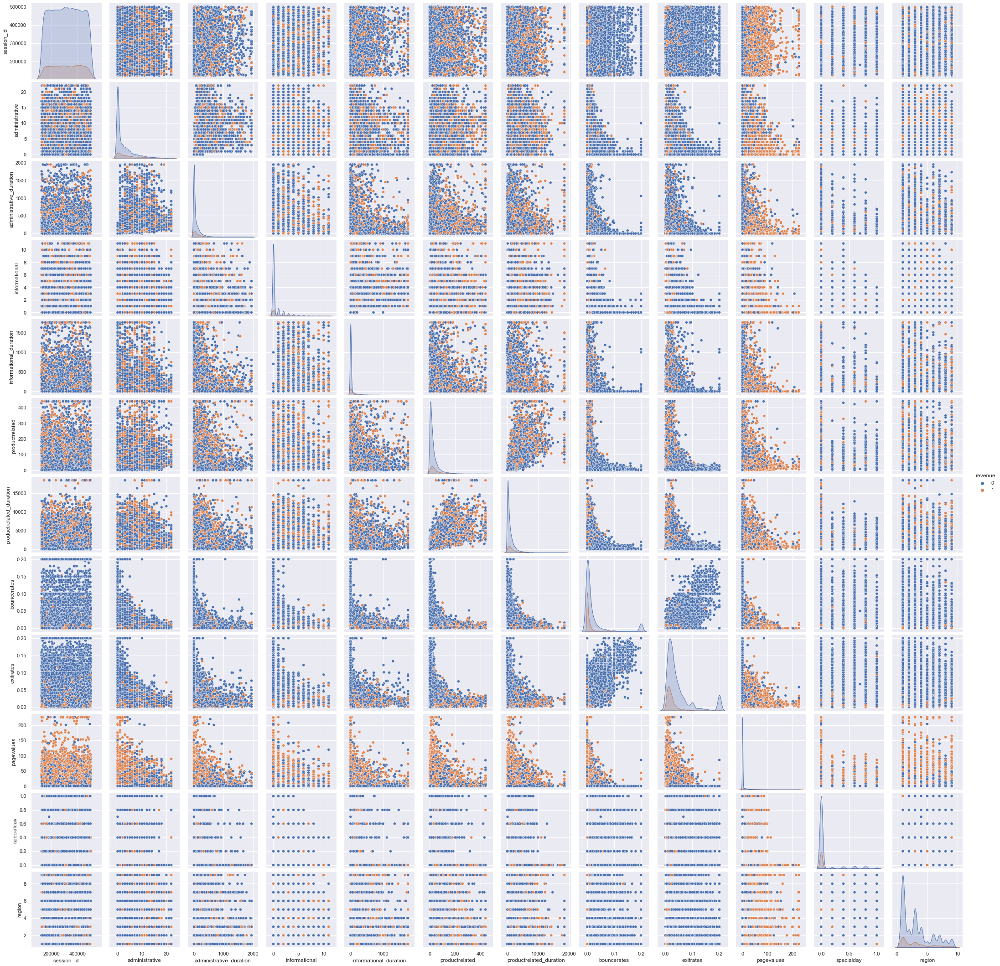

In [81]:
sns.pairplot(df_num,hue='revenue')

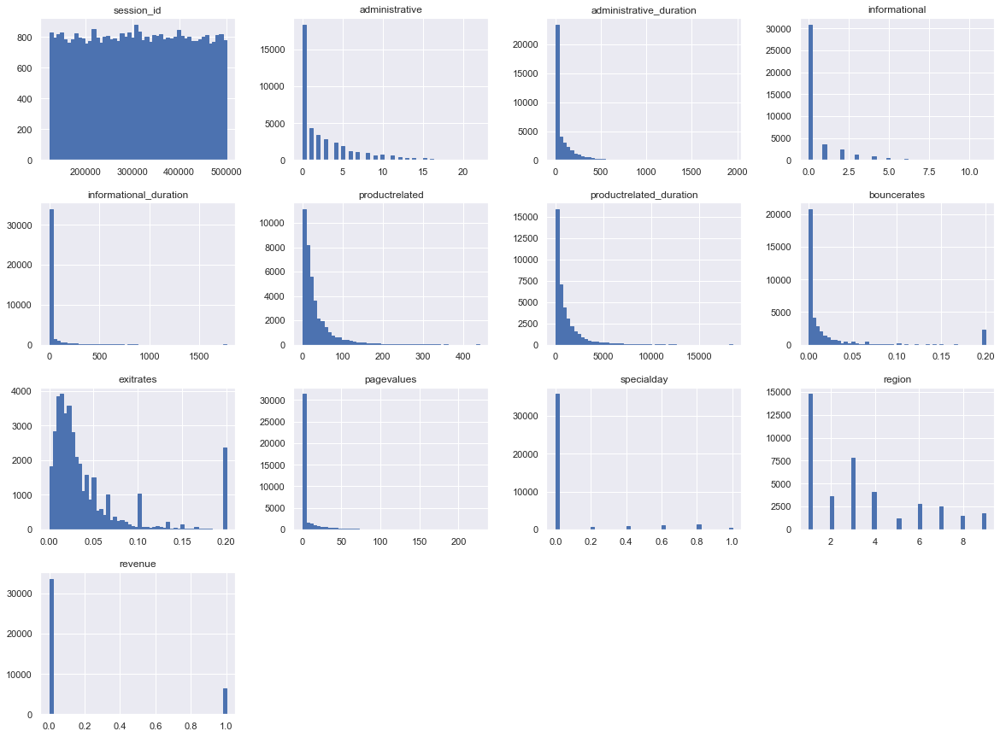

In [62]:
df.hist(bins=50, figsize=(20,15), ec = 'b')
plt.show()

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


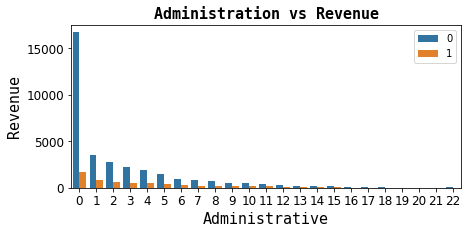

In [12]:
# Creating a countplot of income across sex
# plt.style.use('fivethirtyeight')
plt.figure(figsize=(7, 3))
sns.countplot(df['administrative'], hue=df['revenue'])
plt.title('Administration vs Revenue', fontdict={
          'fontname': 'Monospace', 'fontsize': 15, 'fontweight': 'bold'})
plt.xlabel('Administrative', fontdict={
           'fontname': 'Monospace', 'fontsize': 15})
plt.ylabel('Revenue', fontdict={
           'fontname': 'Monospace', 'fontsize': 15})
plt.tick_params(labelsize=12)
plt.legend(loc=1, prop={'size': 10})
plt.savefig('countplot(bounceratesvsregion).png')
plt.show()

Text(0.5, 0, 'Administrative(no. of pages user visited)')

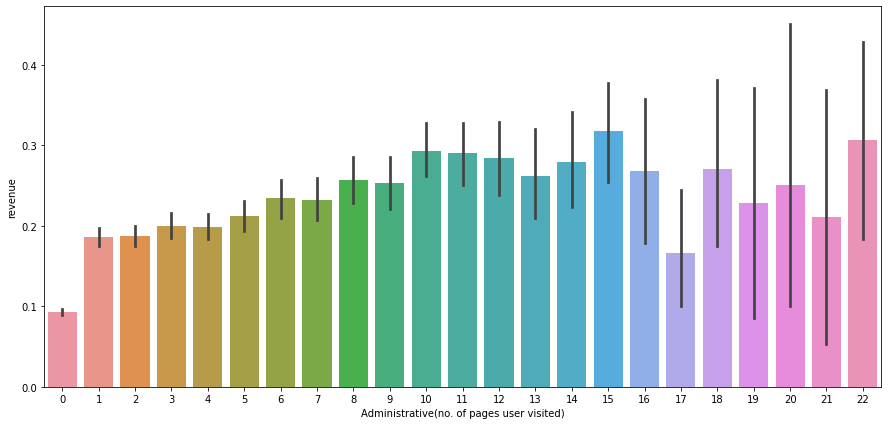

In [13]:
plt.figure(figsize=(15,7))
sns.barplot(x='administrative',y='revenue',data=df)
plt.xlabel('Administrative(no. of pages user visited)')

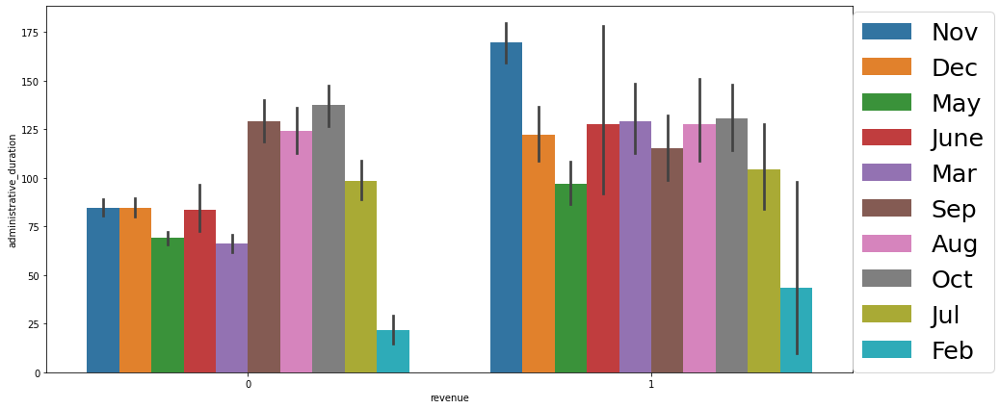

In [14]:
plt.figure(figsize=(15,7))
sns.barplot(y='administrative_duration',x='revenue',data=df,hue='month')
plt.legend(loc=(1,0),prop={'size':25.4})

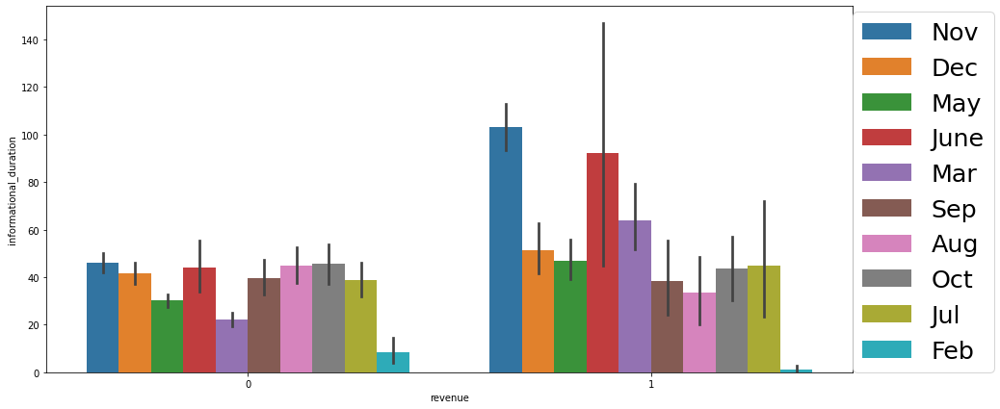

In [15]:
plt.figure(figsize=(15,7))
sns.barplot(y='informational_duration',x='revenue',data=df,hue='month')
plt.legend(loc=(1,0),prop={'size':25.4})

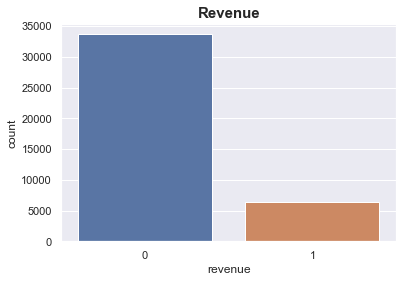

In [16]:
sns.set_theme(style="darkgrid")
colors = sns.color_palette('pastel')[0:5]
plt.figure(figsize=(6,4))
sns.countplot(data=df, x='revenue')
plt.title('Revenue', fontsize=15, fontweight='bold')
plt.show()

In [17]:
# cols = ['browser', 'traffictype','operatingsystems']
df['browser'] = df['browser'].fillna(0)
df['traffictype'] = df['traffictype'].fillna(0)
df['operatingsystems'] = df['operatingsystems'].fillna(0)

In [20]:
# df['browser'] = df['browser'].astype(int)
# df['traffictype'] = df['traffictype'].astype(int)
# df['operatingsystems'] = df['operatingsystems'].astype(int)

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   session_id               40000 non-null  int64  
 1   administrative           40000 non-null  int64  
 2   administrative_duration  40000 non-null  float64
 3   informational            40000 non-null  int64  
 4   informational_duration   40000 non-null  float64
 5   productrelated           40000 non-null  int64  
 6   productrelated_duration  40000 non-null  float64
 7   bouncerates              40000 non-null  float64
 8   exitrates                40000 non-null  float64
 9   pagevalues               40000 non-null  float64
 10  specialday               40000 non-null  float64
 11  month                    40000 non-null  object 
 12  operatingsystems         40000 non-null  object 
 13  browser                  40000 non-null  object 
 14  region                

<AxesSubplot:xlabel='month', ylabel='administrative_duration'>

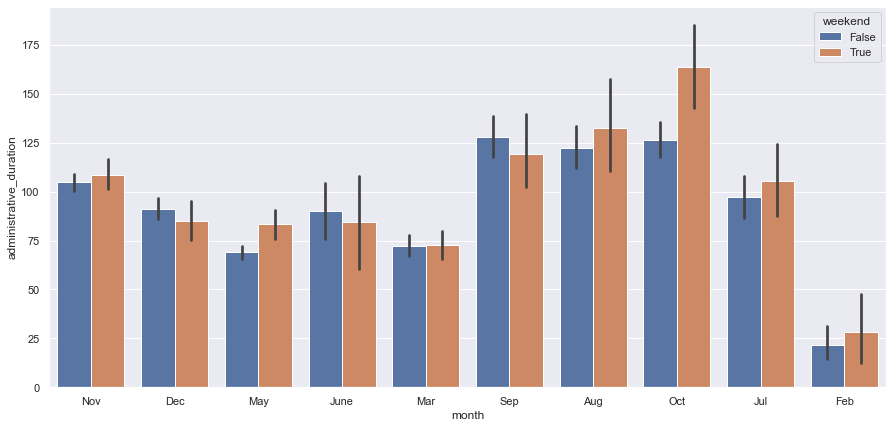

In [22]:
plt.figure(figsize=(15,7))
sns.barplot(y='administrative_duration',x='month',data=df,hue='weekend')

<AxesSubplot:xlabel='month', ylabel='administrative_duration'>

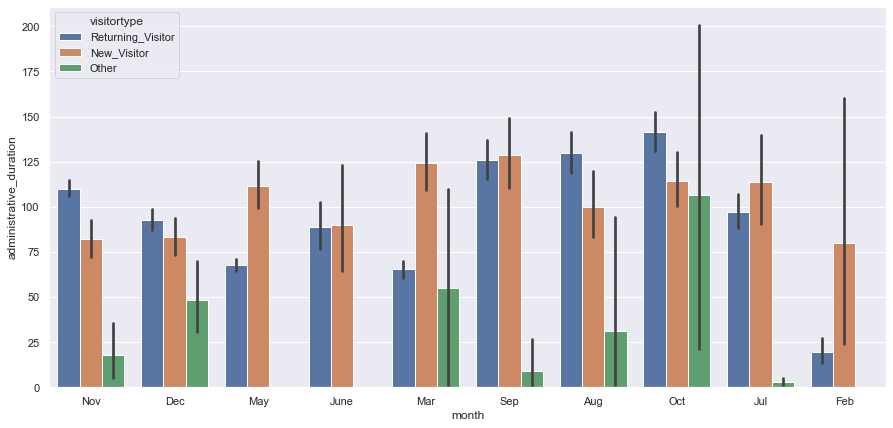

In [23]:
plt.figure(figsize=(15,7))
sns.barplot(y='administrative_duration',x='month',data=df,hue='visitortype')

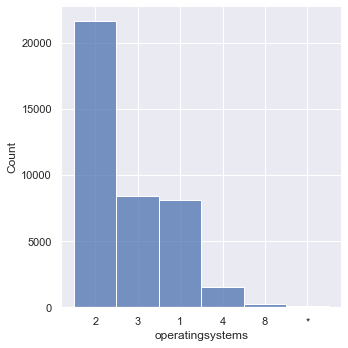

In [24]:
sns.displot(df['operatingsystems'])

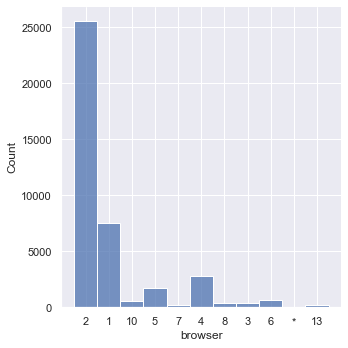

In [25]:
sns.displot(df['browser'])

<AxesSubplot:xlabel='region', ylabel='count'>

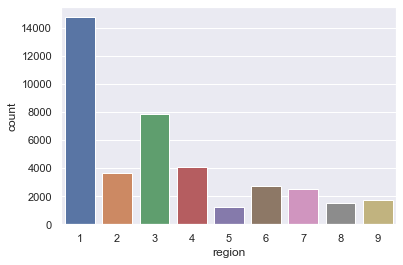

In [26]:
sns.countplot(x='region',data=df)

(0.0, 100.0)

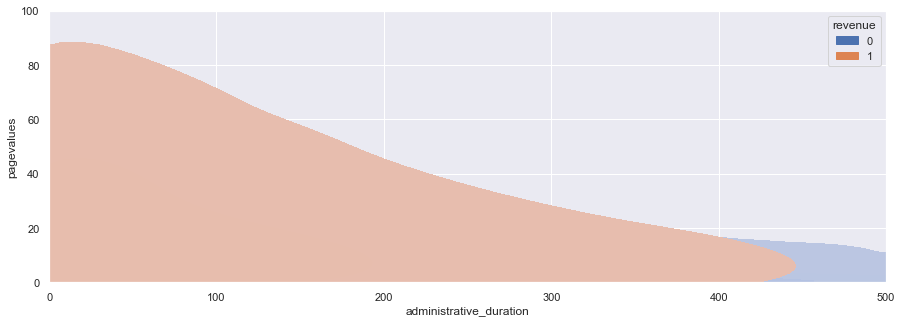

In [27]:
plt.figure(figsize=(15,5))
sns.kdeplot(x='administrative_duration',y='pagevalues',data=df,shade=bool,hue='revenue')
plt.xlim(0,500)
plt.ylim(0,100)

(0.0, 100.0)

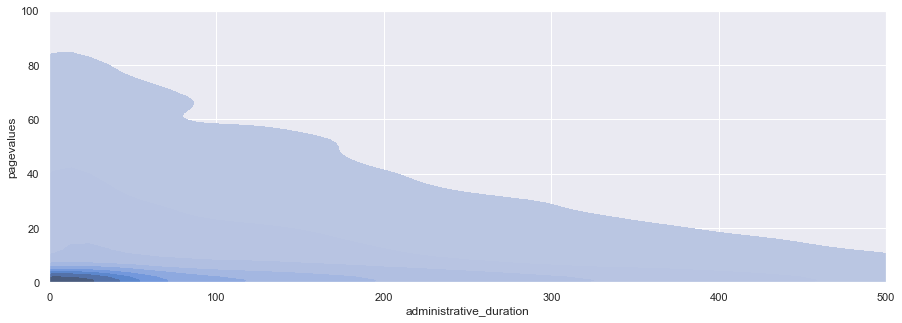

In [28]:
plt.figure(figsize=(15,5))
sns.kdeplot(x='administrative_duration',y='pagevalues',data=df,shade=bool)
plt.xlim(0,500)
plt.ylim(0,100)

<AxesSubplot:xlabel='month', ylabel='informational_duration'>

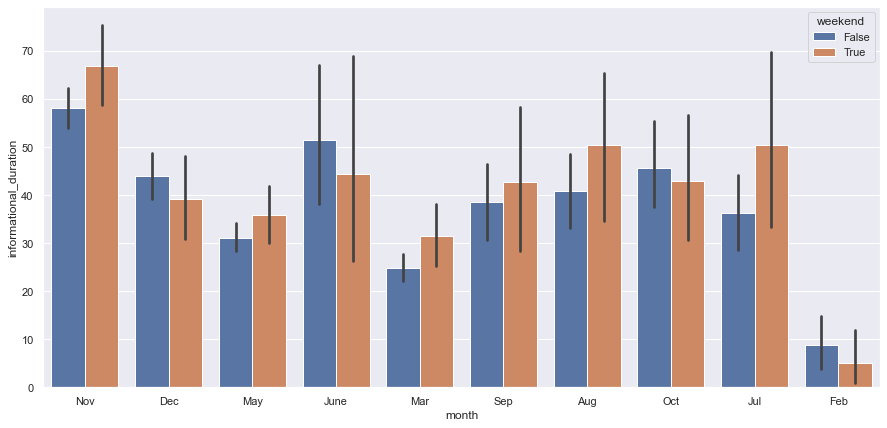

In [29]:
plt.figure(figsize=(15,7))
sns.barplot(y='informational_duration',x='month',data=df,hue='weekend')

(0.0, 100.0)

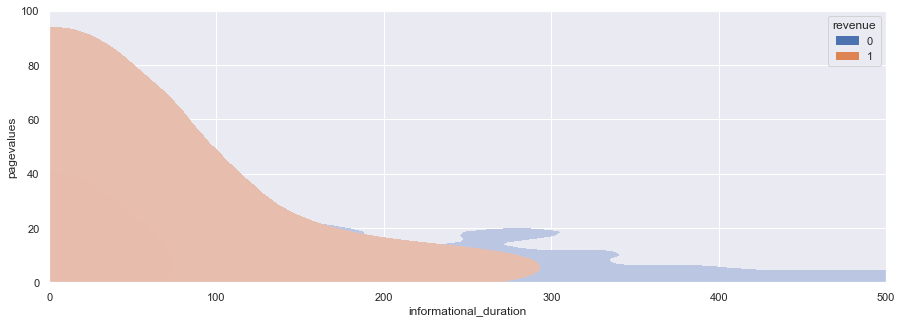

In [31]:
plt.figure(figsize=(15,5))
sns.kdeplot(x='informational_duration',y='pagevalues',data=df,shade=bool,hue='revenue')
plt.xlim(0,500)
plt.ylim(0,100)

<AxesSubplot:xlabel='productrelated_duration', ylabel='exitrates'>

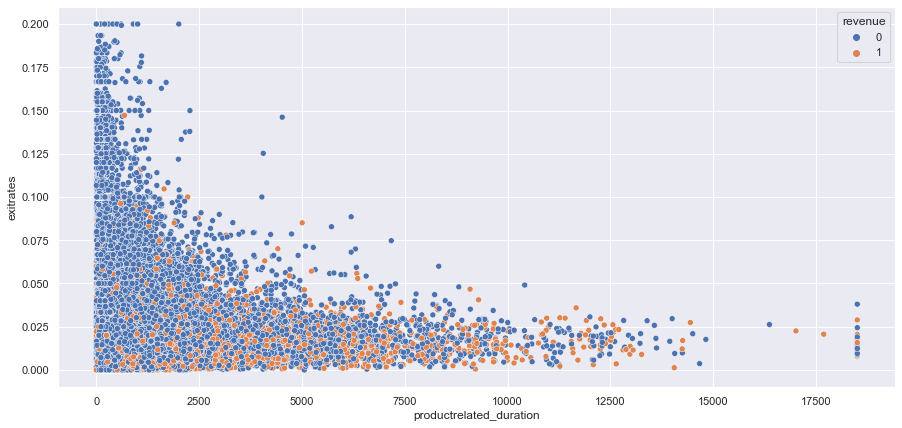

In [33]:
plt.figure(figsize=(15,7))
sns.scatterplot(x='productrelated_duration',y='exitrates',data=df,hue='revenue')

<AxesSubplot:xlabel='bouncerates', ylabel='exitrates'>

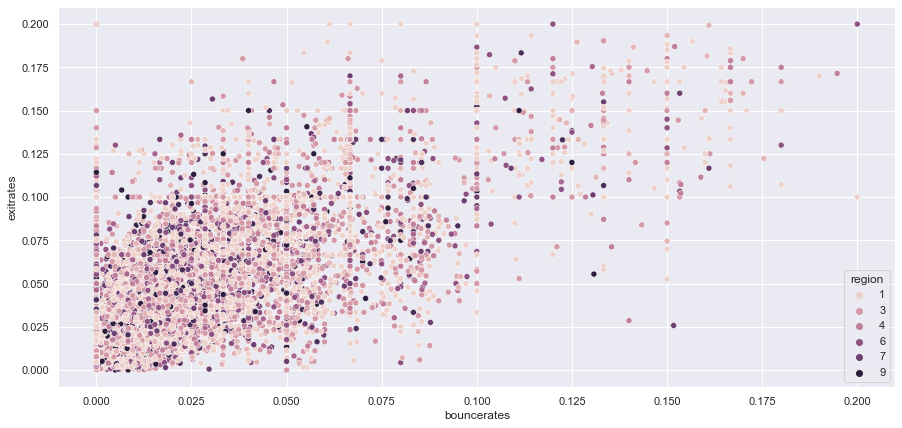

In [34]:
plt.figure(figsize=(15,7))
sns.scatterplot(x='bouncerates',y='exitrates',data=df,hue='region')

<AxesSubplot:xlabel='bouncerates', ylabel='exitrates'>

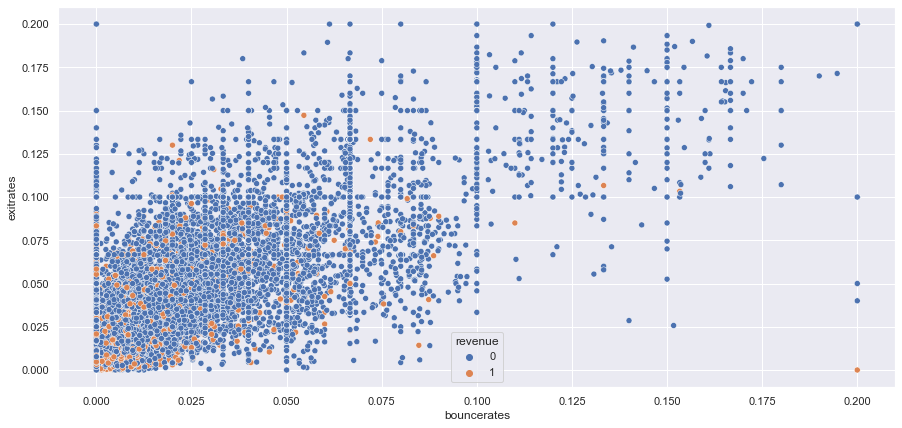

In [35]:
plt.figure(figsize=(15,7))
sns.scatterplot(x='bouncerates',y='exitrates',data=df,hue='revenue')

<AxesSubplot:xlabel='bouncerates', ylabel='exitrates'>

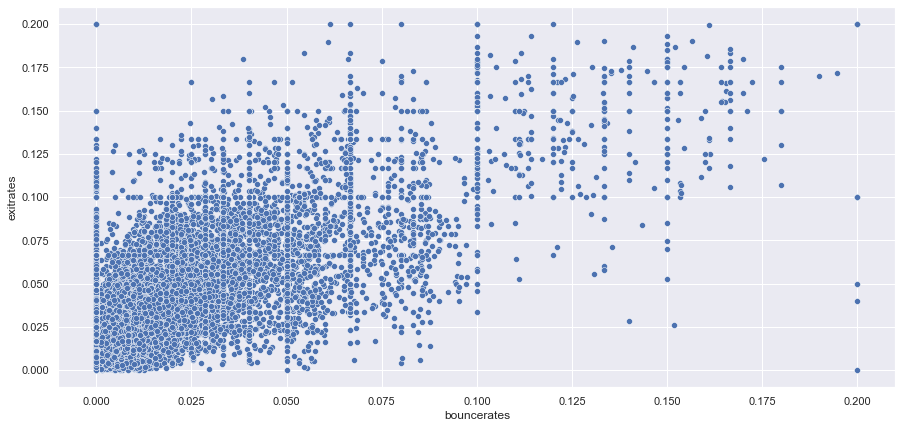

In [36]:
plt.figure(figsize=(15,7))
sns.scatterplot(x='bouncerates',y='exitrates',data=df)

##### Reframing the Dataframe for more Understanding of the Dataset

In [40]:
# Here we change Opearting system value from numerical to caterogical
# Data is take from Google.
df.loc[df['operatingsystems'] == 1,'operatingsystems'] = 'IOS'
df.loc[df['operatingsystems'] == 2,'operatingsystems'] = 'Android Mobile'
df.loc[df['operatingsystems'] == 3,'operatingsystems'] = 'Windows'
df.loc[df['operatingsystems'] == 4,'operatingsystems'] = 'Linux'
df.loc[df['operatingsystems'] == 5,'operatingsystems'] = 'MS-DOS'
df.loc[df['operatingsystems'] == 6,'operatingsystems'] = 'Fedora'
df.loc[df['operatingsystems'] == 7,'operatingsystems'] = 'Ubuntu'
df.loc[df['operatingsystems'] == 8,'operatingsystems'] ='Solaris'

In [41]:
# Here we change Browser value from numerical to caterogical
# Data is take from Google. Top 10 list of browser.
df.loc[df['browser'] == 1,'browser'] = 'Firefox'
df.loc[df['browser'] == 2,'browser'] = 'Google Chrome'
df.loc[df['browser'] == 3,'browser'] = 'Microsoft Edge'
df.loc[df['browser'] == 4,'browser'] = 'Apple Safari'
df.loc[df['browser'] == 5,'browser'] = 'Opera'
df.loc[df['browser'] == 6,'browser'] = 'Brave'
df.loc[df['browser'] == 7,'browser'] = 'UCBrowser'
df.loc[df['browser'] == 8,'browser'] = 'DuckDuckgo'
df.loc[df['browser'] == 9,'browser'] = 'Chromium'
df.loc[df['browser'] == 10,'browser'] = 'Epic'
df.loc[df['browser'] == 11,'browser'] = 'Internet Explorer'
df.loc[df['browser'] == 12,'browser'] = 'Tor Browser'
df.loc[df['browser'] == 13,'browser'] = 'Maxthon'

<AxesSubplot:title={'center':'OperatingSystems'}>

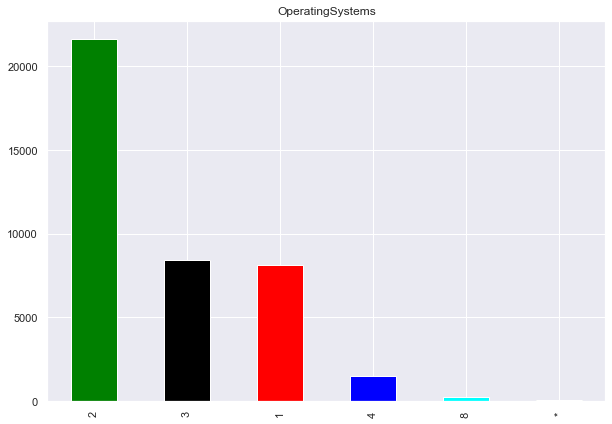

In [47]:
df['operatingsystems'].value_counts().plot.bar(figsize=(10,7), title= 'OperatingSystems', color=['green', 'black', 'red', 'blue', 'cyan'])

<AxesSubplot:title={'center':'Browser'}>

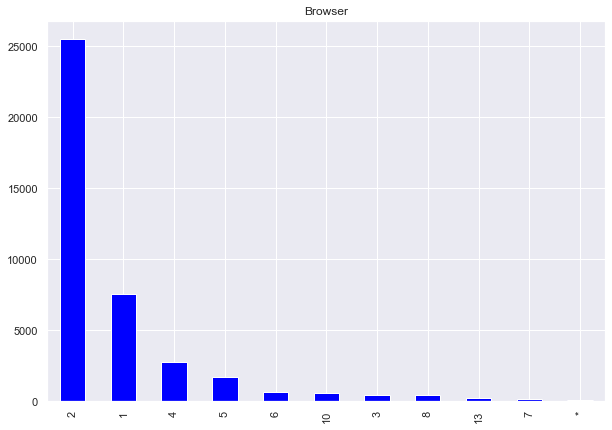

In [48]:
plt.figure(figsize=(10,7))
df['browser'].value_counts().plot.bar(title= 'Browser', color='blue')

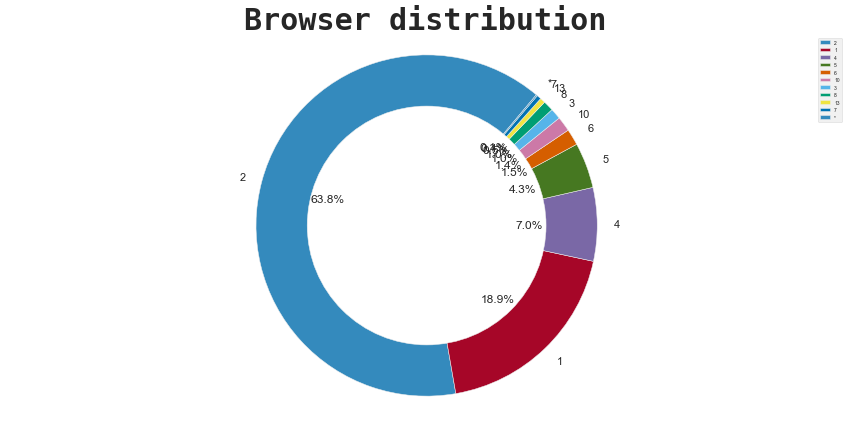

In [83]:
# Creating a donut chart for 'Browser'
relation = df['browser'].value_counts()

plt.style.use('bmh')
plt.figure(figsize=(15, 7))
plt.pie(relation.values, labels=relation.index,
        startangle=50, autopct='%1.1f%%')
centre_circle = plt.Circle((0, 0), 0.7, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.title('Browser distribution', fontdict={
          'fontname': 'Monospace', 'fontsize': 30, 'fontweight': 'bold'})
plt.axis('equal')
plt.legend(prop={'size': 5})
plt.show()

<AxesSubplot:title={'center':'region'}>

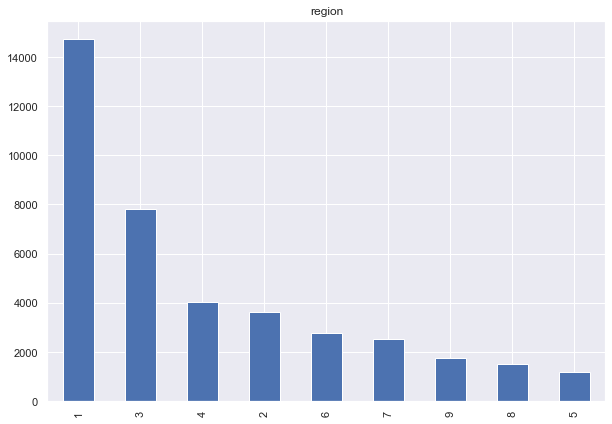

In [49]:
plt.figure(figsize=(10,7))
df['region'].value_counts().plot.bar(title= 'region') 

<Figure size 720x720 with 0 Axes>

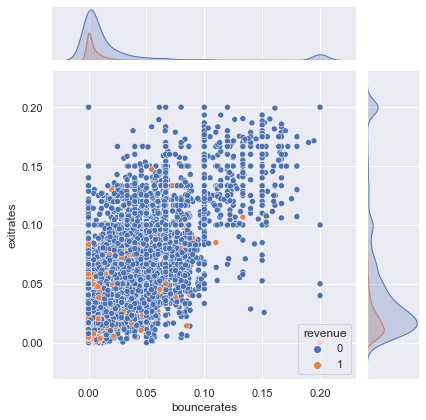

In [53]:
plt.figure(figsize=(10,10))
sns.jointplot(data=df, x="bouncerates", y="exitrates", hue="revenue")

<AxesSubplot:ylabel='Density'>

<Figure size 720x720 with 0 Axes>

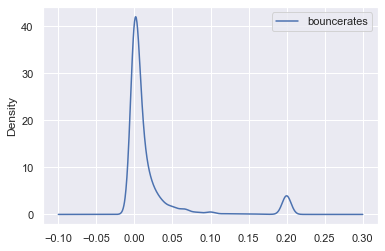

In [55]:
plt.figure(figsize=(10,10))
df.plot(x='pagevalues', y='bouncerates', kind='kde')

In [60]:
a1=[2,1,3,4,8,6,7,5]
a2=[6601,2585,2555,478,79,19,7,6]

In [61]:
import plotly.express as px
import plotly.graph_objs as go

fig = go.Figure(data=[go.Pie(labels=a1,
                             values=a2,title='Percentage of Diffrent OS Used by visitors')])
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

##### Performing the Labelencoding to encode the required columns and mainly the Target Variable

In [91]:
from sklearn.preprocessing import LabelEncoder
for col in df.columns:
    if df[col].dtypes == 'object':
        encoder = LabelEncoder()
        df[col] = encoder.fit_transform(df[col])

In [130]:
corr_data = df.corr('spearman').stack().reset_index(name='corr')
corr_data.loc[corr_data['corr'] == 1, 'corr'] = 0  # Remove diagonal
#Use abs so that we can visualize the impact of negative correaltion  
corr_data['abs'] = corr_data['corr'].abs()
corr_data.sort_values('abs', ascending=False).head(n=5)

,level_0,level_1,corr,abs
79,informational_duration,informational,0.960385,0.960385
61,informational,informational_duration,0.960385,0.960385
39,administrative_duration,administrative,0.931362,0.931362
21,administrative,administrative_duration,0.931362,0.931362
101,productrelated,productrelated_duration,0.841725,0.841725


In [92]:
X=df.drop('revenue',axis=1)
Y=df['revenue']

##### Splitting into Train and Test Dataset

In [93]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,Y,test_size=.3,random_state=0)

In [94]:
print(X_train.shape,y_train.shape)

(28000, 18) (28000,)


In [95]:
print(X_test.shape,y_test.shape)

(12000, 18) (12000,)


##### Model Building Using Classification Algorithms Logistic Regression, Decision Tree, Support Vector Classifier

In [96]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [97]:
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

LogisticRegression()

In [99]:
y_pred_logreg = log_reg.predict(X_test)
accuracy_score(y_test, y_pred_logreg)

0.872

In [100]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_logreg))

              precision    recall  f1-score   support

           0       0.89      0.96      0.93     10132
           1       0.65      0.38      0.48      1868

    accuracy                           0.87     12000
   macro avg       0.77      0.67      0.70     12000
weighted avg       0.86      0.87      0.86     12000



In [101]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(X_train,y_train)

DecisionTreeClassifier()

In [102]:
y_pred_dt = dt.predict(X_test)
accuracy_score(y_test, y_pred_dt)

0.8665833333333334

In [103]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.92      0.92      0.92     10132
           1       0.57      0.59      0.58      1868

    accuracy                           0.87     12000
   macro avg       0.75      0.75      0.75     12000
weighted avg       0.87      0.87      0.87     12000



In [104]:
from sklearn.svm import SVC
from sklearn.svm import LinearSVC,SVC
from sklearn.pipeline import make_pipeline
clf = SVC(C = 1.2, gamma =  0.9, kernel= 'rbf')

In [105]:
clf = clf.fit(X_train,y_train)
y_pred_svc = clf.predict(X_test)

In [106]:
accuracy_score(y_test, y_pred_svc)

0.8443333333333334

##### Standardization of Data to scale the data to fit the data points more precisely

In [107]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

In [108]:
log_reg_scaled = LogisticRegression()
log_reg_scaled.fit(X_train_scaled, y_train)

LogisticRegression()

In [109]:
y_pred_logreg_scaled = log_reg_scaled.predict(X_test_scaled)

In [110]:
accuracy_score(y_test, y_pred_logreg_scaled)

0.8780833333333333

In [111]:
print('=========Classification Report of Logistic Regression with Scaled Data==========')
print(classification_report(y_test, y_pred_logreg_scaled))

=========Classification Report of Logistic Regression with Scaled Data==========
              precision    recall  f1-score   support

           0       0.89      0.97      0.93     10132
           1       0.70      0.38      0.49      1868

    accuracy                           0.88     12000
   macro avg       0.80      0.67      0.71     12000
weighted avg       0.86      0.88      0.86     12000



In [112]:
dt_scaled = DecisionTreeClassifier()
dt_scaled.fit(X_train_scaled,y_train)

DecisionTreeClassifier()

In [113]:
y_pred_dt_scaled = dt_scaled.predict(X_test_scaled)
accuracy_score(y_test, y_pred_dt_scaled)

0.86525

In [114]:
from sklearn.metrics import classification_report
print('=========Classification Report of Decision Tree Classifier with Scaled Data==========')
print(classification_report(y_test, y_pred_dt_scaled))

=========Classification Report of Decision Tree Classifier with Scaled Data==========
              precision    recall  f1-score   support

           0       0.92      0.92      0.92     10132
           1       0.56      0.59      0.57      1868

    accuracy                           0.87     12000
   macro avg       0.74      0.75      0.75     12000
weighted avg       0.87      0.87      0.87     12000



In [124]:
clf_scaled = SVC(C = 1.2, gamma =  0.9, kernel= 'rbf',probability=True)

clf_scaled = clf_scaled.fit(X_train_scaled,y_train)
y_pred_svc_scaled = clf_scaled.predict(X_test_scaled)
accuracy_score(y_test, y_pred_svc_scaled)

0.8581666666666666

In [125]:
print('=========Classification Report of Support Vector Classifier with Scaled Data==========')
print(classification_report(y_test, y_pred_svc_scaled))

=========Classification Report of Support Vector Classifier with Scaled Data==========
              precision    recall  f1-score   support

           0       0.86      0.99      0.92     10132
           1       0.76      0.13      0.22      1868

    accuracy                           0.86     12000
   macro avg       0.81      0.56      0.57     12000
weighted avg       0.85      0.86      0.81     12000



##### ROC Curve

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\Shobhandeb\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but SVC was fitted without feature names



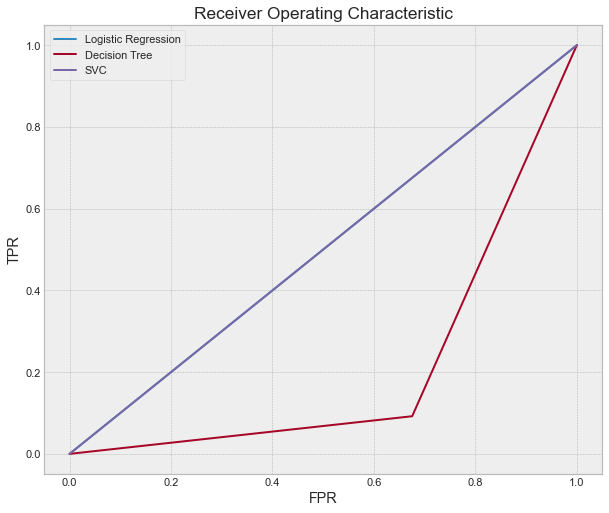

In [126]:
#ROC Curve
from sklearn.metrics import roc_curve
y_pred_prob1 = log_reg_scaled.predict_proba(X_test)[:,1]
fpr1 , tpr1, thresholds1 = roc_curve(y_test, y_pred_prob1)

y_pred_prob2 = dt_scaled.predict_proba(X_test)[:,1]
fpr2 , tpr2, thresholds2 = roc_curve(y_test, y_pred_prob2)


y_pred_prob3 = clf_scaled.predict_proba(X_test)[:,1]
fpr3 , tpr3, thresholds3 = roc_curve(y_test, y_pred_prob3)


# plt.plot([0,1],[0,1], 'k--')
plt.plot(fpr1, tpr1, label= "Logistic Regression")
plt.plot(fpr2, tpr2, label= "Decision Tree")
plt.plot(fpr3, tpr3, label= "SVC")

plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title('Receiver Operating Characteristic')
plt.show()

##### AUC Scores

In [127]:
from sklearn.metrics import roc_auc_score

# auc scores
auc_score1 = roc_auc_score(y_test, y_pred_prob1)
auc_score2 = roc_auc_score(y_test, y_pred_prob2)
auc_score3 = roc_auc_score(y_test, y_pred_prob3)

print(auc_score1,auc_score2,auc_score3)

0.5 0.20834608436306704 0.5


In [ ]:
# output = pd.DataFrame({
# "session_id": test_df["revenue"],
# "revenue": Y_pred
# })

# output.to_csv('my_submission.csv', index=False)
# print("Your submission was successfully saved!")`

##### Submission of the CSV File for Evaluation

In [129]:
submission = pd.DataFrame()
submission['session_id'] = X_test['session_id']
submission['revenue'] = y_pred_logreg_scaled.reshape((y_pred_logreg_scaled.shape[0]))
submission.to_csv('final_submission.csv', index=False)